# Tutored project: Monitoring of deforestation in tropical regions with Sentinel-1 data

## Part 1 : Import of needed libraries

For this notebook, specific libraries are needed and in particular those developped by the ESA and the Copernicus programm in order to help developpers use available open data.

In [1]:
import matplotlib.image as mpimg          # Create vizualisations
import matplotlib.pyplot as plt           # Create vizualisations
from termcolor import colored             # Print colored text
from zipfile import ZipFile               # Zip file manipulation
import os                                 # Data access in file manager 
from glob import iglob                    # Data access in file manager 
from osgeo import gdal, gdal_array, ogr   # Library for raster and geospatial data format
import affine                             # Matrices describing affine transformation of the plane
import pandas as pd                       # Data analysis and manipulation
import geopandas as gpd                   # Extends pandas datatypes 
import numpy as np                        # Scientific computing
import snappy                             # SNAP Python interface
import jpy                                # Python-Java bridge
import io                                 # Core module for I/O
import re                                 # Core module for expression matching operations
import math                               # Core module for mathematical function
import shlex                              # Add a class to parsing simple shell-like syntax
import winshlex
import glob
from subprocess import Popen, PIPE        # Spawn new processes
from s1denoise import Sentinel1Image      # s1denoise algorithm
from datetime import datetime             # Supplies classes for time manipulation

import subprocess

%matplotlib inline                        
from os import listdir
from os.path import isfile, join

## Part 2 : User defined functions

We first define some function usefull for the rest of the notebook

In [2]:
# Adds a quotation mark to string (for command line (cmd)) needed to run SNAP graph
def dq(s):
    return '"' + s + '"'

# Call a terminal and execute a command and print the terminal output in the output cell
def execute(command):
    with Popen(shlex.split(command), stdout=PIPE, bufsize=1, universal_newlines=True, shell = True) as p:
        while True:
            line = p.stdout.readline()
            if not line:
                break
            print(line)
        exit_code = p.poll()
    return exit_code

# Create an array of the same size and resolution as the source data and burn points from an ESRI shapefile layer
def points_to_array(data_source, point_coords):
    # data_source - gdal raster object
    # points_coords - list of points (x,y) coordinates in the same projection as data source
    data_array = np.array(data_source.GetRasterBand(1).ReadAsArray())
    data_array[:] = 0
    for p in point_coords:
        x, y = p[0], p[1]
        forward_transform = affine.Affine.from_gdal(*data_source.GetGeoTransform())
        reverse_transform = ~forward_transform
        px, py = reverse_transform * (x, y)
        px, py = int(px + 0.5), int(py + 0.5)        
        pixel_coord = px, py
        data_array[pixel_coord[1]][pixel_coord[0]] = 1 # inverse de 0 et 1    
    return data_array   # output is a numpy array

# Convert the ESRI shapefile ice chart to a raster with identical size and resolution as pre-processed sentinel-1
# image. A single specified attribute will be use to provide pixel values
def rasterize_chart(data_source, polygon_shp, attribute="Class_ID"): #CT
    # data source - gdal raster object used as model
    # polygon_shp - path to the ESRI shapefile we wish to rasterize
    # attribute - one of the shapefile attribute, to be used to populate the raster values
    geo_transform = data_source.GetGeoTransform()
    x_res = data_source.RasterXSize
    Y_res = data_source.RasterYSize
    shp_v = ogr.Open(polygon_shp)
    shp_l = shp_v.GetLayer()
    target_ds = gdal.GetDriverByName( 'MEM' ).Create( "", data_source.RasterXSize, data_source.RasterYSize, 1, gdal.GDT_Int16)
    target_ds.SetGeoTransform(data_source.GetGeoTransform())
    band = target_ds.GetRasterBand(1)
    band.SetNoDataValue(-9999)
    band.Fill(-9999)
    gdal.RasterizeLayer(target_ds, [1], shp_l, options=["ATTRIBUTE=" + attribute])
    b_array = band.ReadAsArray()
    return b_array # Output is a numpy array

## Section 3 : User input data

We specify all the path to the input data

In [3]:
# Directory containing downloaded zipped Sentinel-1 EW GRDM product
input_directory ='./Original/' #'./AUX_DATA/Sentinel1_data/'
#input_directory ='./test_data/test_area_1/' #'./AUX_DATA/Sentinel1_data/'
# Directory where preprocessed product will be saved
prep_directory = './Processing/train/without_speckle_filter/'
#prep_directory = './test_data/test_area_1/preprocessed/'
test_directory = './Processing/test/without_speckle_filter/'
validation_directory = './validation_data/'
# SNAP graph file adapted for use with python
graph_file_path = './snap_graph/forest_graph.xml'
# Point shapefile containing randomly generated sampling points in our study area for training data retrieval
points_file = './validation_data/points_S1A_IW_GRDH_1SDV_20220219T225309_20220219T225334_041988_050033_7A47_prep.shp'
# Location of the pre-processed ice charts (reprojected to final product proj)
#ice_chart = 'D:/Documents/MASTER SPAPS SUPAERO/COURS/Services and Integrated Applications/webinar_final/AuxData/Ice_Charts/' ####################################
polygons_path = './validation_data/' #forest_non_forest.shp

onlyfiles = [f for f in listdir(input_directory) if isfile(join(input_directory, f))]
print(onlyfiles)

border_pix = 150 # Number of pixels to discard along the image edge to remove border noise (used in subset op.)
glcm_windowsize = '11x11' # Parameter used in the Gray Level Co-occurence Matrc operator
p_spacing = 10.0 # final product pixel size (used in terrain correction op.) - orig. value 40m

# UTM Zone 48 /  World Geodetic System 1984
# Arctic: 'EPSG:4326'
proj = 'EPSG:4326' # Final product projection (used in Terrain correction op.)
dem = 'SRTM 3Sec' # Digital Elevation model (used in terrain correction op.)

# We define each area of interest that we want to use
#area_of_interest = 'POLYGON ((105.18260192871094 13.256216049194336, 105.05313110351562 13.256216049194336, 105.05313110351562 13.186837196350098, 105.18260192871094 13.186837196350098, 105.18260192871094 13.256216049194336, 105.18260192871094 13.256216049194336))' # Matthieu zone train 1
#area_of_interest = 'POLYGON ((107.1267982665005 13.991038088341824, 107.18830146393557 13.990491062293836, 107.18775106007685 13.932178321795462, 107.12626330315967 13.932722978680628, 107.1267982665005 13.991038088341824))' # Matthieu zone train 2
#POLYGON ((107.11 13.98, 107.18 13.98, 107.18 13.94, 107.11 13.94, 107.11 13.98))

#area_of_interest = 'POLYGON ((105.78154815968325 13.175691216466419, 105.9659561225578 13.17506306114407, 105.96494819185368 12.915271322096803, 105.7807325969025 12.91588667345265, 105.78154815968325 13.175691216466419))' # Matthieu zone test 1
area_of_interest = 'POLYGON ((105.99069395184961 13.15543833277517, 105.73994614230878 13.203427695700984, 105.69331879463257 12.970801041441941, 105.94400983611534 12.92270305420209, 105.99069395184961 13.15543833277517))' # Matthieu zone test 1 without the river


#area_of_interest='POLYGON ((103.96751510964434 13.77880167852718, 104.55066309718259 13.89167332732214,   104.48700907785462 14.21093620013617, 103.90301861220294 14.098240603801063, 103.96751510964434 13.77880167852718))' # Alex zone train 1
#¶area_of_interest='POLYGON ((103.13396312795396 11.11546813174455, 103.59292685984009 11.20557166782215, 103.55853368472076 11.381356875904945, 103.09864125410137 11.291225187430943, 103.13396312795396 11.11546813174455))' # Alex zone train 2

['S1A_IW_GRDH_1SDV_20181009T224423_20181009T224448_024065_02A150_D743.zip', 'S1A_IW_GRDH_1SDV_20190502T111212_20190502T111237_027048_030BEC_CB5C.zip', 'S1A_IW_GRDH_1SDV_20220219T225309_20220219T225334_041988_050033_7A47.zip', 'S1B_IW_GRDH_1SDV_20201115T111919_20201115T111948_024275_02E282_7405.zip']


[[Ljava.lang.String;(objectRef=0x00000181EA90C0F8), [Ljava.lang.String;(objectRef=0x00000181E935EAA8), [Ljava.lang.String;(objectRef=0x00000181EB0E9FB8), [Ljava.lang.String;(objectRef=0x00000181EB0E60E0)]


,Name,Date,Sensing Mode,Product Type,Polarization,Height,Width,Available Bands,Preprocessed
0,S1A_IW_GRDH_1SDV_20181009T224423_20181009T2244...,09 Oct. 2018,1SDV,20181009T224423,1SDV,16798,25140,"[Amplitude_VH, Intensity_VH, Amplitude_VV, Int...",True
1,S1A_IW_GRDH_1SDV_20190502T111212_20190502T1112...,02 May. 2019,1SDV,20190502T111212,1SDV,16763,25585,"[Amplitude_VH, Intensity_VH, Amplitude_VV, Int...",True
2,S1A_IW_GRDH_1SDV_20220219T225309_20220219T2253...,19 Feb. 2022,1SDV,20220219T225309,1SDV,16771,25180,"[Amplitude_VH, Intensity_VH, Amplitude_VV, Int...",True
3,S1B_IW_GRDH_1SDV_20201115T111919_20201115T1119...,15 Nov. 2020,1SDV,20201115T111919,1SDV,19472,25160,"[Amplitude_VH, Intensity_VH, Amplitude_VV, Int...",True


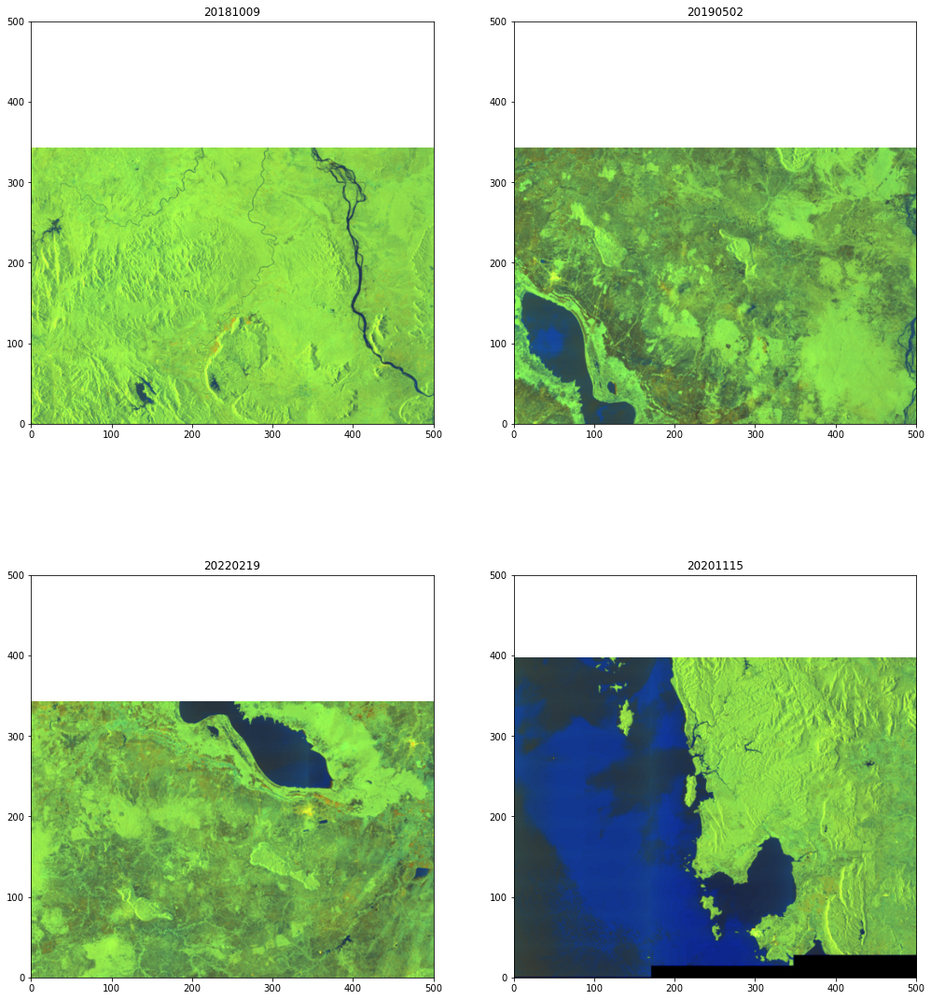

In [4]:
# Create a list of downloaded zipped Sentinel-1 products available in the input directory
#input_S1_files = list(iglob(os.path.join(input_directory, '*S1*.zip'), recursive=True)) ###
input_S1_files = [os.path.normpath(i) for i in glob.glob(os.path.join(input_directory, '*S1*.zip'))]

#input_S1_files = input_S1_files[:21]
#input_S1_files.sort(key = lambda x: x.split('_')[-4])# Sort the product list date of acquisition
name, date, mode, product_type, polarization, height, width, band_names, preprocessed = ([] for i in range(9))

# Create a figure to vizualize the input data
fig = plt.figure(figsize = (17, 20))
fig.tight_layout(w_pad = 1, h_pad = 1)
d = math.ceil(math.sqrt(len(input_S1_files)))
f = 0

for i in input_S1_files: # Loop over downloaded zipped Sentinel-I products available in the input directory 
    mode.append(i.split("_")[3])
    product_type.append(i.split("_")[4]) 
    polarization.append(i.split("_")[-6]) 
    f+=1          
    # Read zipped product with snappy
    s1_read = snappy.ProductIO.readProduct(i) 
    s1_name = s1_read.getName() # Get product name
    ac_date = re.split('_|T',s1_name)[4] # Get product acquisition date 
    date.append(datetime.strftime(datetime.strptime(ac_date, '%Y%m%d'),'%d %b. %Y'))
    name.append(s1_name)
    # Get raster dimensions and band names 
    height.append(s1_read.getSceneRasterHeight()) 
    width.append(s1_read.getSceneRasterWidth()) 
    band_names.append(s1_read.getBandNames())
    s1_read.dispose()
    # Check if preprocessed products are available in the Output directory
    #proc = os.path.join(prep_directory,os.path.basename(i))#.split('T')[0] ###
    proc = prep_directory+re.split('.zip',os.path.basename(i))[-2] + '_prep.tif'
    
    if os.path.isfile(proc):
        preprocessed.append(True)
    else:
        preprocessed.append(False)
    with ZipFile(i, 'r') as qck_look: # Visualize a quick-look image available in the original file 
        qck_look = qck_look.read(s1_name + '.SAFE/preview/quick-look.png')
        qck_look = io.BytesIO(qck_look)
        img = mpimg.imread(qck_look)
        ax = fig.add_subplot(d,d,f)
        ax.title.set_text(ac_date)
        ax.set_xlim(0, 500) 
        ax.set_ylim(0, 500) 
        ax.imshow(img)

print(band_names)
# Create the Input data data frame
df_s1_data = pd.DataFrame({'Name': name, 'Date': date, 'Sensing Mode': mode,'Product Type': product_type, 
                           'Polarization': polarization ,'Height': height, 'Width': width, 
                           'Available Bands': band_names, 'Preprocessed': preprocessed})
display(df_s1_data)

In [5]:
print(list(band_names))

[[Ljava.lang.String;(objectRef=0x00000181EA90C0F8), [Ljava.lang.String;(objectRef=0x00000181E935EAA8), [Ljava.lang.String;(objectRef=0x00000181EB0E9FB8), [Ljava.lang.String;(objectRef=0x00000181EB0E60E0)]


## Section 5: Sentinel - 1 Pre-processing GTP and snappy

### 5.1: Sentinel-1 Denoising algorithm

In [6]:
def do_s1denoising(input_zip_path, output_dir, img_id):
    # Read input Sentinel - I product
    p = snappy.ProductIO.readProduct(input_zip_path) # Open the original zipped product with snappy
    print(p)
    width, height = p.getSceneRasterWidth(), p.getSceneRasterHeight()
    ip = os.path.join(output_dir, 'ip_'+img_id+'.dim')   # Path to temporary output file
    ### Create the new product and bands to which the denoised images will be written
    denoised = snappy.Product('Sentinel-1', 'GRD', width, height)   # Create new empty snappy product
    
    #Add and setup an empty band for HH polarization
    HHBand = denoised.addBand('Sigma0_VH_db',snappy.ProductData.TYPE_FLOAT32)
    HHBand.setNoDataValue(np.nan)
    HHBand.setNoDataValueUsed(True)
    HHBand.setUnit('sigma0_db')
    
    #Add and setup an empty band for HV polarization
    HVBand = denoised.addBand('Sigma0_VV_db',snappy.ProductData.TYPE_FLOAT32)
    HVBand.setNoDataValue(np.nan)
    HVBand.setNoDataValueUsed(True)
    HVBand.setUnit('sigma0_db')
    
    #Add and setup an empty band for incidence angle
    IABand = denoised.addBand('Incidence_angle',snappy.ProductData.TYPE_FLOAT32)
    IABand.setNoDataValue(np.nan)
    IABand.setNoDataValueUsed(True)
    IABand.setUnit('degree')
    writer = snappy.ProductIO.getProductWriter('BEAM-DIMAP')   # Get the snappy write operator
    
    snappy.ProductUtils.copyGeoCoding(p, denoised)  # Copy the geocoding of the original S1 image to the output
    snappy.ProductUtils.copyMetadata(p, denoised)  # Copy the metadata of the original S1 image to the output
    denoised.setProductWriter(writer)
    denoised.writeHeader(ip)
    
    ### Sentinel1Denoised processing
    s1 = Sentinel1Image(input_zip_path)   # Open the original zipped product with the Sentinel1Denoised SW
    # run thermal noise correction in the VH polarization using the ESA algorithm (No HH option in sentinel1denoised)
    s0_vh = s1.remove_thermal_noise('VH', algorithm = 'ESA')
    # run thermal and texture noise correction in the HV polarization
    s0_vv = s1.remove_texture_noise('VV')
    
    # get incidence angle for each pixel as an array
    ia = s1['incidence_angle']
    
    HHBand.writePixels(0, 0, width, height, s0_vh) # Write the corrected HH band to temporary output product
    HVBand.writePixels(0, 0, width, height, s0_vv) # Write the corrected HV band to temporary output product
    IABand.writePixels(0, 0, width, height, ia) # Write the incidence angle to temporary output product
    denoised.closeIO() # Close the temporary output to save it to disk
    p.dispose(), denoised.dispose()
    print(colored('Sentinel-1 Thermal and textural correction performed sucessfully','blue'))
    return ip

### 5.2: Pre-processing of input data

In [7]:
## 5.2: Preprocess new data
prep_data = []  # Create a list of preprocessed image pathfor further use
polygons_list = []
points_list = []

i = 0
for index, row in df_s1_data.iterrows():   # Iterate over the rows of the data frame created in step 4  
#     list(iglob(os.path.join(input_directory, '*S1*.zip'), recursive=True))
    
    s1 = os.path.join(input_directory, row['Name']) # Recreate path to the original zipped product
    #row['Preprocessed'] = True ################################################################################## A ENLEVER    
    if row['Preprocessed']: # Check if pre-processed product exists, if YES then append its path to the list
        print(colored('Product '+row['Name']+' is already pre-processed','green'))
        prep_data.append(os.path.join(prep_directory,row['Name'] + '_prep.tif')) #.split('T')[0]
    else:  # If pre-processed produt does not exist
        print(colored('Pre-processing product '+row['Name']+'!','red'))
        start = datetime.now()
        ### External Sentinel 1 Denoising Algorithm
        s1d_product = do_s1denoising(s1+'.zip', prep_directory, row['Name'])  # Apply the denoising function created in 5.1
        
        ### Process Graph
        #Create pixel coordinates used to remove the border noisein the Subset step
        border_rem = "%s,%s,%s,%s" % (border_pix, border_pix, row['Width'] - 2*border_pix, row['Height'] - 2*border_pix)
        # Define output product name and path
        out_path = os.path.join(prep_directory,os.path.basename(s1) + '_prep') ### .split('T')[0]
        print(out_path)
        # Create command to be passed to the terminal
        '''
        cmd_parts = ['gpt',dq(str(graph_file_path)),"-PInput_zip="+dq(str(s1)),"-PInput_s1denoised=" + dq(str(s1d_product)),
                    "-PBorder_removal=" + dq(border_rem),
                    "-PMask_vector=" + dq(mask),
                    "-PWindow_size=" + dq(glcm_windowsize),
                    "-PDEM=" + dq(dem),"-PPixel_size=" + dq(str(p_spacing)),"-PPCSR=" + dq(proj),
                    "-POutput_file=" + dq(out_path)]
        '''
        cmd_parts = ['gpt',dq(str(graph_file_path)),"-PInput_zip="+dq(str(s1)),"-PInput_s1denoised=" + dq(str(s1d_product)),
                    "-PWindow_size=" + dq(glcm_windowsize),
                    "-PDEM=" + dq(dem),"-PPixel_size=" + dq(str(p_spacing)),"-PPCSR=" + dq(proj),
                    "-Ppolygon="+dq(area_of_interest),
                    "-POutput_file=" + dq(out_path)]
        code = execute(' '.join(cmd_parts)) # Execute the command in the terminal
        df_s1_data.at[index,'Preprocessed'] = True  # When pre-processing is finnished update the data frame
        prep_data.append(out_path+'.tif') # Append the path to the list of preprocessed images
        end = datetime.now()
        print(colored('Product ' + row['Name'] + ' successfully pre-processed in '+str(end-start) + '!','green'))
    
    polygons_list.append(os.path.join(validation_directory,'polygons_'+row['Name'] + '_prep.shp'))
    points_list.append(os.path.join(validation_directory,'points_'+row['Name'] + '_prep.shp'))

Product S1A_IW_GRDH_1SDV_20181009T224423_20181009T224448_024065_02A150_D743 is already pre-processed
Product S1A_IW_GRDH_1SDV_20190502T111212_20190502T111237_027048_030BEC_CB5C is already pre-processed
Product S1A_IW_GRDH_1SDV_20220219T225309_20220219T225334_041988_050033_7A47 is already pre-processed
Product S1B_IW_GRDH_1SDV_20201115T111919_20201115T111948_024275_02E282_7405 is already pre-processed


### 5.3: Visualize a single pre-processed product subset

Projection is PROJCS["WGS 84 / UTM zone 48N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",105],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32648"]]


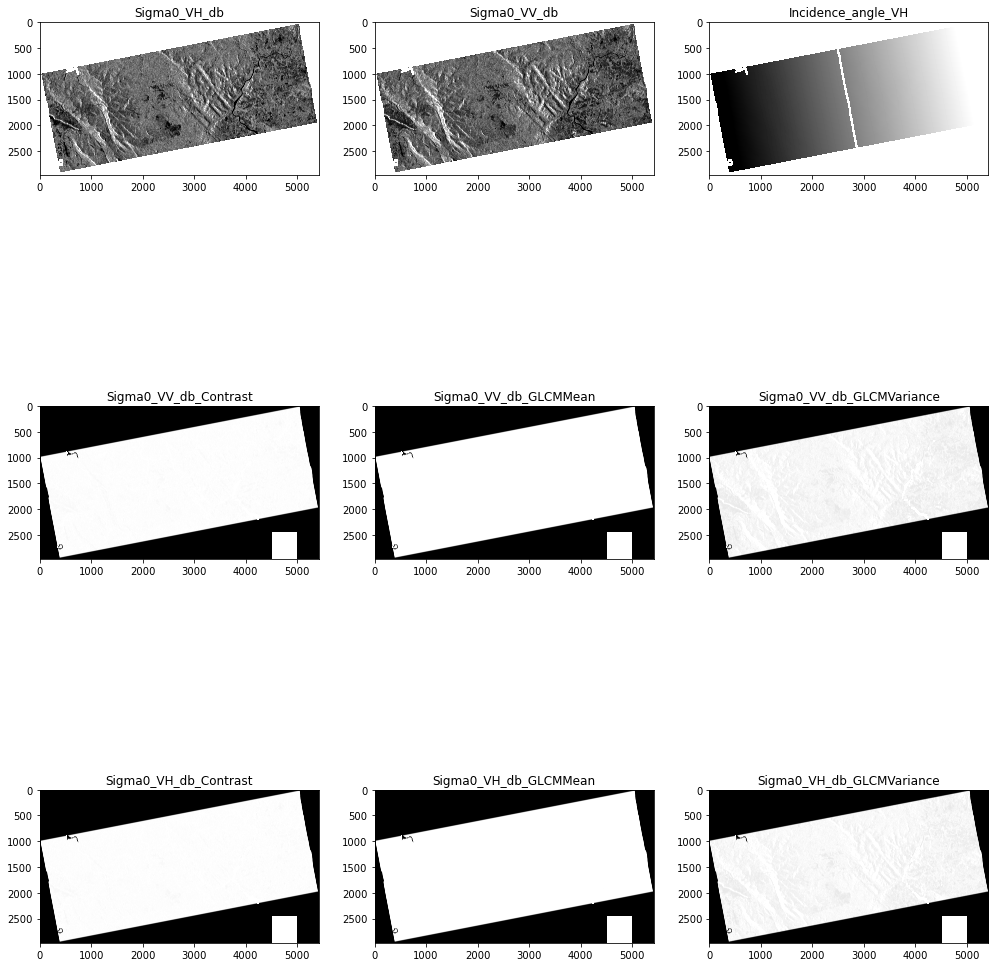

In [8]:
# Get list of band names
prep_vis = snappy.ProductIO.readProduct(prep_data[-1])
bands = list(prep_vis.getBandNames())

# Load next to last pre-processed product
prep_vis = gdal.Open(prep_data[-1])
print("Projection is {}".format(prep_vis.GetProjection()))

# Create a figure to visualize the input data
fig = plt.figure(figsize = (17,20))
fig.tight_layout(w_pad = 1,h_pad =1)
d = math.ceil(math.sqrt(len(bands)))

# Visualize each band
for band in range(1,len(bands)+1):
    # lets only visualize a subset of the data
    vis = prep_vis.GetRasterBand(band).ReadAsArray()
    ax = fig.add_subplot(d,d,band)
    ax.title.set_text(bands[band-1])
    vis[vis == 0.0] = np.nan
    ax.imshow(vis,cmap='gray',vmin = np.nanpercentile(vis,5),vmax = np.nanpercentile(vis,95))

## Section 6: Extract Training/Validation Data

### 6.1: Load sampling points

In [9]:
coords = {}
for x in points_list:  
    pts = gpd.read_file(x)  # Read the ESRI Shapefile containing sampling points
    #pts = pts[['UTM_E','UTM_N', 'geometry']] # Attributes in the ESRI Shapefile
    pts.index = range((len(pts)))
    coords[re.split('points_|_prep.shp',x)[-2]] = [(x,y) for x, y in zip(pts['geometry'].x, pts['geometry'].y)] # Create the (x,y) coordinate list

for key, value in coords.items():
     print('longueur ' + key + ': ' + str(len(value)))

'''
pts = gpd.read_file(points_file)  # Read the ESRI Shapefile containing sampling points
#pts = pts[['UTM_E','UTM_N', 'geometry']] # Attributes in the ESRI Shapefile
pts.index = range((len(pts)))
coords = [(x,y) for x, y in zip(pts['geometry'].x, pts['geometry'].y)] # Create the (x,y) coordinate list
print(coords)
'''

longueur S1A_IW_GRDH_1SDV_20181009T224423_20181009T224448_024065_02A150_D743: 2075
longueur S1A_IW_GRDH_1SDV_20190502T111212_20190502T111237_027048_030BEC_CB5C: 1071
longueur S1A_IW_GRDH_1SDV_20220219T225309_20220219T225334_041988_050033_7A47: 2416
longueur S1B_IW_GRDH_1SDV_20201115T111919_20201115T111948_024275_02E282_7405: 1763


"\npts = gpd.read_file(points_file)  # Read the ESRI Shapefile containing sampling points\n#pts = pts[['UTM_E','UTM_N', 'geometry']] # Attributes in the ESRI Shapefile\npts.index = range((len(pts)))\ncoords = [(x,y) for x, y in zip(pts['geometry'].x, pts['geometry'].y)] # Create the (x,y) coordinate list\nprint(coords)\n"

### 6.2: Create Ice chart dictionary & Reclasification dictionary


In [10]:
# Create ice chart list
#charts = list(iglob(os.path.join(ice_chart, 'arctic*.shp'), recursive=True)) # list available ice charts
#charts = list(iglob(os.path.join(polygons_path, 'polygons*.shp'), recursive=True)) # list available ice charts
charts = [os.path.normpath(i) for i in glob.glob(os.path.join(polygons_path, 'polygons*.shp'))]
forest_charts_d = {}
for chart in charts: # for each chart add entry to the dictionary
    #chart_date = '20' + re.split('arctic|.shp',chart)[-2] # chart publication date as string
    chart_id = re.split('polygons_|_prep.shp',chart)[-2] # chart publication date as string
    forest_charts_d[chart_id] = chart

# Stage of development labels reclassification and aggregation {new value: [[original value list], class name]}
# The defined class are arbitrary, code d
'''
sod_label = {0: [[0,98], 'Ice Free'], 1: [[81,82], 'New Ice'], 2: [[83, 84, 85, 86, 87], 'Young Ice'], 
             3: [[88,89,91,93], 'First Year Ice'], 4: [[94,95,96,97], 'Old Ice']}
'''
class_label = {1: 'forest', 2: 'nonforest'}
print(forest_charts_d)

{'S1A_IW_GRDH_1SDV_20181009T224423_20181009T224448_024065_02A150_D743': 'validation_data\\polygons_S1A_IW_GRDH_1SDV_20181009T224423_20181009T224448_024065_02A150_D743_prep.shp', 'S1A_IW_GRDH_1SDV_20190502T111212_20190502T111237_027048_030BEC_CB5C': 'validation_data\\polygons_S1A_IW_GRDH_1SDV_20190502T111212_20190502T111237_027048_030BEC_CB5C_prep.shp', 'S1A_IW_GRDH_1SDV_20220219T225309_20220219T225334_041988_050033_7A47': 'validation_data\\polygons_S1A_IW_GRDH_1SDV_20220219T225309_20220219T225334_041988_050033_7A47_prep.shp', 'S1B_IW_GRDH_1SDV_20201115T111919_20201115T111948_024275_02E282_7405': 'validation_data\\polygons_S1B_IW_GRDH_1SDV_20201115T111919_20201115T111948_024275_02E282_7405_prep.shp'}


### 6.3 : Extract training data

In [11]:
'''
#print(prep_ds.GetRasterBand(9).ReadAsArray())
prep_ds = gdal.Open(prep_data[0]) # Open image with GDAL
if prep_ds is not None: 
    print ("band count: " + str(prep_ds.RasterCount))
'''
prep_data

['./Processing/train/without_speckle_filter/S1A_IW_GRDH_1SDV_20181009T224423_20181009T224448_024065_02A150_D743_prep.tif',
 './Processing/train/without_speckle_filter/S1A_IW_GRDH_1SDV_20190502T111212_20190502T111237_027048_030BEC_CB5C_prep.tif',
 './Processing/train/without_speckle_filter/S1A_IW_GRDH_1SDV_20220219T225309_20220219T225334_041988_050033_7A47_prep.tif',
 './Processing/train/without_speckle_filter/S1B_IW_GRDH_1SDV_20201115T111919_20201115T111948_024275_02E282_7405_prep.tif']

In [12]:
#len(coords[re.split(prep_directory+'|_prep.tif','./Processing/train/S1A_IW_GRDH_1SDV_20181009T224423_20181009T224448_024065_02A150_D743_prep.tif')[-2]])

In [13]:
## Create empty training and validation dataframe

prep_vis = snappy.ProductIO.readProduct(prep_data[-1]) ###
bands = list(prep_vis.getBandNames()) ###


tv_dataset = pd.DataFrame([])

# Loop over preprocesses images except for last image which will be used for the final classification
for i in prep_data: #############################################[:-1]: ATTENTION A REMETTRE
    prep_ds = gdal.Open(i) # Open image with GDAL
    ac_date = re.split('_|T',i)[-2] # Extract image acquisition date
    #ac_t = datetime.strptime(ac_date,"%Y%m%d") # Convert acquisition date to timestamp    
    '''
    # Find closest ice chart
    chart_t = min(ice_charts_d.keys(), key = lambda k: abs(k - ac_t).days if (k- ac_t).days >= -1 else 1000)
    date_offset = (chart_t - ac_t).days # Get chart and image date of offset in days

    if date_offset > 6: # Check if acquisition date between -4 and +1 day of chart pub
        continue
    else:
        chart_p = ice_charts_d.get(chart_t)[0] # Get ice chart path
    '''
    # We find the chart associated to the radar image
    chart_p = forest_charts_d[re.split(prep_directory+'|_prep.tif',i)[-2]]
    # Convert attribute to raster identical in extent and resolution to pre-prcossed image
    chart_sa = rasterize_chart(prep_ds, chart_p, attribute = "Class_ID")
    my_coords = coords[re.split(prep_directory+'|_prep.tif',i)[-2]]
    sampling_points = points_to_array(prep_ds, my_coords) # Convert sampling point coordinates to 0/1 array --> Mask

    # Create zero filled multi-dimensional array of the same size as the preprocessed image
    prep_img = np.zeros((prep_ds.RasterYSize, prep_ds.RasterXSize, prep_ds.RasterCount),
                         gdal_array.GDALTypeCodeToNumericTypeCode(prep_ds.GetRasterBand(1).DataType))

    for b in range(prep_img.shape[2]): # Read each band of preprocessed image into the mutli-dim. array
        prep_img[:, :, b] = prep_ds.GetRasterBand(b+1).ReadAsArray()

    #iread block failed at TiffReadEncodestrip failed 
        
    
    #chart_id = [re.split(prep_directory+'|_prep.tif',k)[-2] for k in prep_data]* len(my_coords)###
    chart_id = [re.split(prep_directory+'|_prep.tif',i)[-2]]* len(my_coords)
    ### img_dates = ([ac_date] * len(coords))
    ### chart_dates = ([ice_charts_d.get(chart_t)[1]] * len(coords))
    ### diff = ([date_offset] * len(coords))
    sa = chart_sa[sampling_points > 0] # Get ice chart value for each sampling point as a list
    raster_val = prep_img[sampling_points>0] # Get band values for each sampling point as a list

    # Collect extracted data to a temporary dataframe - each row corresponds to one sampling point
    #df_dataset = pd.DataFrame({'Image date': img_dates, 'Ice-chart date': chart_dates, 'Date offset': diff, 'SoD': sa})
    df_dataset = pd.DataFrame({'id': chart_id, 'class': sa})

    for b in range(0,len(bands)): # List of bands given in the visualization step is reused here as colum
        df_dataset[bands[b]] = raster_val[:,b]

    # Append the temporary dataframe to the main trainiing and validation dataframe
    tv_dataset = tv_dataset.append(df_dataset, ignore_index=True)
    df_dataset = None

print('Train dataset shape: ' + str(tv_dataset.shape))

# Remove No Data - remove any rows containing no data values
tv_dataset.drop(tv_dataset[tv_dataset['class']<0].index, inplace= True) # in ice chart no data are
tv_dataset.dropna(inplace=True)

# We drop the column 'incidence angle'
tv_dataset.drop('Incidence_angle_VH', axis=1, inplace=True)
bands.remove('Incidence_angle_VH')

print('Train dataset shape: ' + str(tv_dataset.shape))


# Reclassify the Stage of Development classes based on the dictionary created in step 6.2
'''
for label in sod_label:
    tv_dataset['SoD'].replace(sod_label.get(label)[0], label, inplace=True)
'''
tv_dataset.loc[::100,:]

Train dataset shape: (7325, 11)
Train dataset shape: (6683, 10)


,id,class,Sigma0_VH_db,Sigma0_VV_db,Sigma0_VV_db_Contrast,Sigma0_VV_db_GLCMMean,Sigma0_VV_db_GLCMVariance,Sigma0_VH_db_Contrast,Sigma0_VH_db_GLCMMean,Sigma0_VH_db_GLCMVariance
0,S1A_IW_GRDH_1SDV_20181009T224423_20181009T2244...,2,-75.117500,-102.008598,190.064667,19.964399,282.699951,158.762558,26.278959,426.033966
105,S1A_IW_GRDH_1SDV_20181009T224423_20181009T2244...,2,-108.774422,-105.165970,364.264435,19.270554,357.088806,313.536530,18.060953,313.779449
216,S1A_IW_GRDH_1SDV_20181009T224423_20181009T2244...,2,-69.226311,-68.871811,273.065430,23.319210,406.070740,251.884155,26.504011,478.310760
321,S1A_IW_GRDH_1SDV_20181009T224423_20181009T2244...,2,-74.460091,40.270470,363.287598,37.180191,847.830200,304.191315,27.366390,518.524109
426,S1A_IW_GRDH_1SDV_20181009T224423_20181009T2244...,1,-73.453133,31.281647,186.012375,43.422714,1037.724609,276.402100,31.246164,622.058289
...,...,...,...,...,...,...,...,...,...,...
6815,S1B_IW_GRDH_1SDV_20201115T111919_20201115T1119...,1,-52.973602,19.462143,285.379883,40.955296,961.224670,326.896149,33.598217,717.543640
6926,S1B_IW_GRDH_1SDV_20201115T111919_20201115T1119...,2,-62.635632,-102.407471,26.572481,4.330461,21.837118,189.446152,20.029837,290.619781
7031,S1B_IW_GRDH_1SDV_20201115T111919_20201115T1119...,2,-78.928070,6.177938,198.117447,31.846853,605.726868,242.705185,37.821873,825.457581
7135,S1B_IW_GRDH_1SDV_20201115T111919_20201115T1119...,2,-105.006432,-42.571190,286.749237,23.976517,417.029236,132.970184,11.781478,132.276932


In [14]:
print(tv_dataset.groupby(['class']).size())
print(tv_dataset.shape)

class
1    3665
2    3018
dtype: int64
(6683, 10)


In [15]:
# Let's balance the dataset so that each class is represented in an equivalent way
nb_to_drop = 400
#tv_dataset = tv_dataset.drop(tv_dataset[tv_dataset['class'].eq(1)].sample(nb_to_drop).index)
# We display again the new number of samples for each class
print(tv_dataset.groupby(['class']).size())

class
1    3665
2    3018
dtype: int64


In [16]:
from sklearn.model_selection import train_test_split
# Split input dataset to training and validation data
y = tv_dataset['class'].values
x = tv_dataset[bands].values
x_train, x_test,y_train,y_test = train_test_split(x, y, test_size=0.10)

## Section 7: Random Forest Classification

### 7.1: Train the RF classifier

In [17]:
# We create a gridsearch operation so as to tune the hyperparameters of the model
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRFClassifier
# We define the parameters combination that we want to try
grid_params = { 
    'n_estimators': [480,500,520,550,570,600,700,800],
}
'''
'max_features': ['auto', 'sqrt', 'log2'],
'max_depth' : [4,5,6,7,8],
'criterion' :['gini', 'entropy']
'''
# We define the GridSearchCV by specifying the model we want to use (here KNN)
grid_search = GridSearchCV(
    XGBRFClassifier(random_state=42, oob_score = True),
    grid_params,
    scoring='accuracy', #accuracy 
    verbose=1,
    cv=5,
    n_jobs=-1
)

In [18]:
#import sklearn
#sorted(sklearn.metrics.SCORERS.keys())

In [19]:
# We launch the gridsearch operation which will train the model for each parameter combination
grid_search_result = grid_search.fit(x_train, y_train)

print('Grid search best scores: ', grid_search_result.best_score_)
print('Grid search best estimator: ', grid_search_result.best_estimator_)
print('Grid search best parameters: ', grid_search_result.best_params_)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


C:\Users\matth\anaconda3\envs\forest_env\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:59:44] WARNING: D:\bld\xgboost-split_1631904903843\work\src\learner.cc:573: 
Parameters: { "oob_score" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[10:59:46] WARNING: D:\bld\xgboost-split_1631904903843\work\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Grid search best scores:  0.7911524571820587
Grid search best estimator:  XGBRFClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
                colsample_bytree=1, gamma=0, gpu_id=-1, importance_type='gain',
                interaction_constraints='', max_delta_step=0, max_depth=6,
                min_child_weight=1, missing

In [20]:
'''
from sklearn.ensemble import RandomForestClassifier

# Initialize our model with 500 trees
rf = RandomForestClassifier(n_estimators = 500, oob_score = True) 

# Fit our model to training data
rf = rf.fit(x_train, y_train)

#The OOb score of the training dataset obtained using an out-of-bag estimate
print('Our OOB prediction of accuracy is: {oob}%'.format(oob = rf.oob_score_*100))

# Feature (band) importance score
for b,imp in zip(bands,rf.feature_importances_):
    print('Band {b} importance: {imp}'.format(b=b,imp=imp))
'''

"\nfrom sklearn.ensemble import RandomForestClassifier\n\n# Initialize our model with 500 trees\nrf = RandomForestClassifier(n_estimators = 500, oob_score = True) \n\n# Fit our model to training data\nrf = rf.fit(x_train, y_train)\n\n#The OOb score of the training dataset obtained using an out-of-bag estimate\nprint('Our OOB prediction of accuracy is: {oob}%'.format(oob = rf.oob_score_*100))\n\n# Feature (band) importance score\nfor b,imp in zip(bands,rf.feature_importances_):\n    print('Band {b} importance: {imp}'.format(b=b,imp=imp))\n"

### 7.2: Model Statistics

[[334  32]
 [ 93 210]]


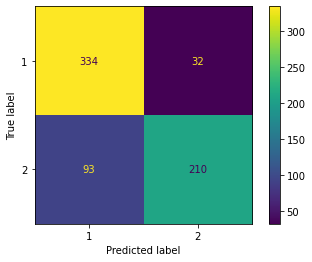

In [21]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix #Confusion matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import precision_score

# Run prediction on the test dataset
#y_pred = rf.predict(x_test)

# Gridsearch evaluates the results using cross-validation
y_pred = grid_search.predict(x_test)


# We display a confusion matrix
train_confusion_matrix = confusion_matrix(y_pred=y_pred,y_true=y_test)
print(train_confusion_matrix)
#plt.imshow(train_confusion_matrix, cmap='binary')

plot_confusion_matrix(grid_search, x_test, y_test)  
plt.show()

In [22]:
print(np.shape(x_test))

class_names = [v[1] for v in list(class_label.values())]
print(classification_report(y_test, y_pred)) # rajouter quand on aura plus de classe target_names=class_names

(669, 8)
              precision    recall  f1-score   support

           1       0.78      0.91      0.84       366
           2       0.87      0.69      0.77       303

    accuracy                           0.81       669
   macro avg       0.82      0.80      0.81       669
weighted avg       0.82      0.81      0.81       669



In [23]:
test = np.array([[2,-9999],[0,4]])
mask = np.array([False,True])
my_test = test[mask,:]

print(test)
print(mask)
print(my_test)


'''
mask_null_values = np.array([[1]*test.shape[1] if -9999 not in x else [0]*test.shape[1] for x in test])
#print(mask_null_values.shape)
img_as_array_not_null = test[mask_null_values]
#img_as_array_not_null = np.delete(test,mask,axis=0)
print(mask_null_values)
'''

[[    2 -9999]
 [    0     4]]
[False  True]
[[0 4]]


'\nmask_null_values = np.array([[1]*test.shape[1] if -9999 not in x else [0]*test.shape[1] for x in test])\n#print(mask_null_values.shape)\nimg_as_array_not_null = test[mask_null_values]\n#img_as_array_not_null = np.delete(test,mask,axis=0)\nprint(mask_null_values)\n'

### 7.3: Classify the temporal serie of our test images

In [24]:
bands

['Sigma0_VH_db',
 'Sigma0_VV_db',
 'Sigma0_VV_db_Contrast',
 'Sigma0_VV_db_GLCMMean',
 'Sigma0_VV_db_GLCMVariance',
 'Sigma0_VH_db_Contrast',
 'Sigma0_VH_db_GLCMMean',
 'Sigma0_VH_db_GLCMVariance']

In [25]:
#%%time
from IPython.display import clear_output

# We get all test images
test_img_list = [os.path.normpath(i) for i in glob.glob(os.path.join(test_directory, '*.tif'))]
class_prediction_list = []
mask_list = []

for test_img_name in test_img_list:
    start = datetime.now()
    #clear_output(wait=True)
    print('Classifying image :' + test_img_name)
    
    prep_vis = snappy.ProductIO.readProduct(test_img_name)
    bands = list(prep_vis.getBandNames())
    test_img = gdal.Open(test_img_name)   # Open the last processed image

    # Create multi-dimensional array
    to_classify = np.zeros((test_img.RasterYSize, test_img.RasterXSize, test_img.RasterCount-1),
                           gdal_array.GDALTypeCodeToNumericTypeCode(test_img.GetRasterBand(1).DataType))
    print(to_classify.shape)
    # We remove the band represented by the incidence angle
    #to_classify = np.delete(to_classify, 3, 2)
    #to_classify[np.nonzero(to_classify)]
    
    '''
    for b in range(to_classify.shape[2]): 
        # Load each band into an array and write to the empty array created above
        to_classify[:, :, b] = test_img.GetRasterBand(b + 1).ReadAsArray()
    '''
    # Code to handle the removal of the "incidence angle" band
    band_counter = 0
    for band in range(0,len(bands)):
        if bands[band] !='Incidence_angle_VH':
            to_classify[:, :, band_counter] = test_img.GetRasterBand(band+1).ReadAsArray()
            band_counter += 1
            
        
    # Take our full image and reshape into long 2D array (nrow * ncol, nband) for classification
    new_shape  = (to_classify.shape[0] * to_classify.shape[1], to_classify.shape[2])
    img_as_array = to_classify[:, :, :].reshape(new_shape)
    print('Reshaped from {o} to {n}'.format(o = to_classify.shape, n = img_as_array.shape))

    # Assign value -9999 to all NoData pixels as the classification algorithm do not accepts NaN
    img_as_array[np.isnan(img_as_array)] = -9999

    # --- Added part ---
    print('First processing...')
    # Let's create a mask with 1 = non null values and 0 = null values
    mask_null_values = np.zeros(img_as_array.shape[0], dtype=np.int64)
    img_as_array_not_null = []
    
    
    #mask_null_values = [True if -9999 not in x else False for x in img_as_array]
    #img_as_array_not_null = img_as_array[mask_null_values,:]
    
    for i in range(img_as_array.shape[0]):
        if -9999 not in img_as_array[i]:
            mask_null_values[i] = 1
            img_as_array_not_null.append(list(img_as_array[i]))    
    
    img_as_array_not_null = np.array(img_as_array_not_null)
    # --- End added part ---
    print('First processing finished...')
    
    # Now predict for each pixel
    print('Prediction...')
    #class_prediction = rf.predict(img_as_array_not_null) ###img_as_array
    class_prediction = grid_search.predict(img_as_array_not_null) ###img_as_array
    print('Prediction finished !')
    
    print('Final processing...')
    # Reshape our classification map
    #class_prediction = class_prediction.reshape(to_classify[:, :, 0].shape) ########
    # --- Added part ---
    class_prediction = list(class_prediction)
    # We transform the mask into the final array containing the predicted classes for each pixel
    index_list = 0
    '''
    # We convert the mask from boolean to integer
    mask_null_values_int = np.array(list(map(int, mask_null_values)))
    # We put the predictions in the finale array
    class_prediction = np.array([class_prediction.pop() if x==1 else x for x in mask_null_values])
    '''
    for i in range(mask_null_values.shape[0]):
        if mask_null_values[i] == 1:
            mask_null_values[i] = class_prediction[index_list]
            index_list += 1 # We select the next classification result

    class_prediction_list.append(mask_null_values.reshape(to_classify[:, :, 0].shape))  
    # --- End Added part ---
    print('Final processing finished !')
    end = datetime.now()
    print(colored("Classification completed in " + str(end-start) + '!', "green"))
    
    # Create a mask for NoData values
    mask_list.append(to_classify[:, :, 0] != -9999.)

Classifying image :Processing\test\without_speckle_filter\S1A_IW_GRDH_1SDV_20171002T224441_20171002T224506_018640_01F6EE_F159_prep.tif
(3115, 3244, 8)
Reshaped from (3115, 3244, 8) to (10105060, 8)
First processing...
First processing finished...
Prediction...
Prediction finished !
Final processing...
Final processing finished !
Classification completed in 0:01:03.949037!
Classifying image :Processing\test\without_speckle_filter\S1A_IW_GRDH_1SDV_20181009T224448_20181009T224513_024065_02A150_1CA5_prep.tif
(3115, 3243, 8)
Reshaped from (3115, 3243, 8) to (10101945, 8)
First processing...
First processing finished...
Prediction...
Prediction finished !
Final processing...
Final processing finished !
Classification completed in 0:00:59.933168!
Classifying image :Processing\test\without_speckle_filter\S1A_IW_GRDH_1SDV_20190712T224449_20190712T224514_028090_032C22_71F8_prep.tif
(3115, 3243, 8)
Reshaped from (3115, 3243, 8) to (10101945, 8)
First processing...
First processing finished...
Pre

In [26]:
class_prediction_list_filtered = class_prediction_list.copy()

### 7.4: Post-classification filtering

In [27]:
from skimage import morphology
from skimage.morphology import rectangle # for Structuring Elements (e.g. disk, rectangle) to shape our moving ...
from skimage.filters.rank import modal   # modal/modality filter
from skimage.morphology import area_closing
from skimage.util import img_as_ubyte

'''
for i in range(len(class_prediction_list_filtered)):
    # Run the majority filter with a rectangular moving window with size of 7x7 pixels
    class_prediction_list_filtered[i] = modal((class_prediction_list_filtered[i]), rectangle(30,30), mask = mask_list[i])
    #modal filter size: 15,15
    '''
    # We apply a post-processing filter in order to remove the smallest elements
    green_mask = class_prediction_list_filtered[i] == 1
    red_mask = np.where(class_prediction_list_filtered[i]==2 ,1,0) > 0
    red_mask_final = morphology.remove_small_objects(red_mask, min_size=500,connectivity=8)
    #red_mask_final= area_closing(red_mask, 10000, connectivity=8)
    class_prediction_list_filtered[i] = np.where(red_mask_final,2,0) # Remaining red pixels
    class_prediction_list_filtered[i][(red_mask_final==False) & (red_mask==True)]=1 # Former red pixels
    class_prediction_list_filtered[i][green_mask] = 1 # green pixels
    '''
    # Closing filter - combination of dilation + erosion
    #class_prediction_list_filtered[i] = area_closing(class_prediction_list_filtered[i], 100, connectivity=1)
    #result[mask==False] = 0  # 5 is our no data value so we can apply it again 
'''

C:\Users\matth\anaconda3\envs\forest_env\lib\site-packages\IPython\core\interactiveshell.py:3343: UserWarning: Possible precision loss converting image of type int64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  exec(code_obj, self.user_global_ns, self.user_ns)
C:\Users\matth\anaconda3\envs\forest_env\lib\site-packages\skimage\util\dtype.py:525: UserWarning: Downcasting int64 to uint8 without scaling because max value 2 fits in uint8
  return _convert(image, np.uint8, force_copy)


In [28]:
#result=class_prediction

## Section 8 : Classification results visualisation

### 8.1: Visualisation settings

In [29]:
# create a color palette with specific colors assigned to specific type
'''
colors = dict((
  (0, (30, 144, 255, 255)),		# blue - Ice free
  (1, (255, 192, 203, 255)),	# pink - New ice
  (2, (138, 43, 226, 255)),		# purple - Young ice
  (3, (50, 205, 50, 255)),		# green - First year ice
  (4, (128, 0, 0, 255)),		# sienna - Old ice
  (5, (255, 255, 255, 255)),	#white - No data
))
'''
colors = dict((
  (0, (255, 255, 255, 255)),	# white - No data
  (1, (0, 255, 0, 255)),		# green - forest
  (2, (255, 0, 0, 255)),	# red - nonforest
))
# Put 0 - 255 as float 0 - 1
for k in colors:
  v = colors[k]
  _v = [_v / 255.0 for _v in v]
  colors[k] = _v


index_colors = [colors[key] if key in colors else (255, 255, 255, 0) for key in range(0,3)]
cmap = plt.matplotlib.colors.ListedColormap(index_colors, 'Classification', 3)

### 8.2: Classification visualisation

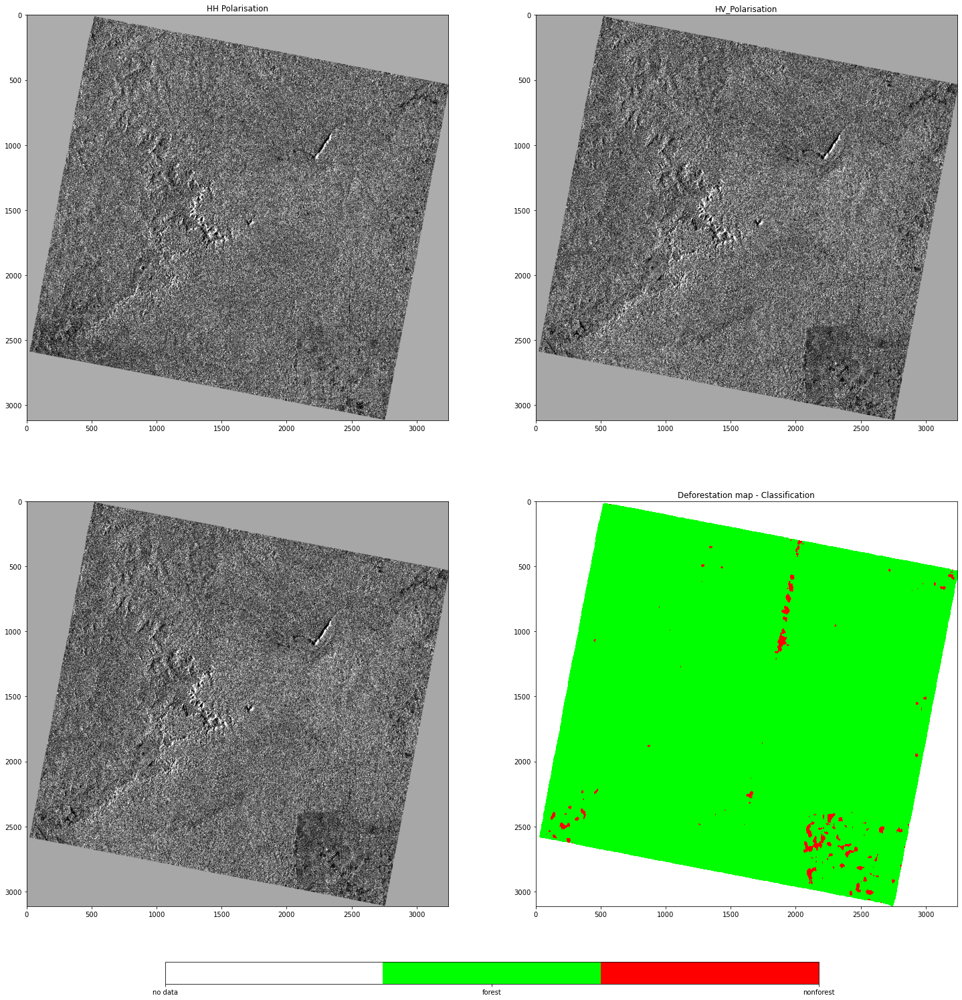

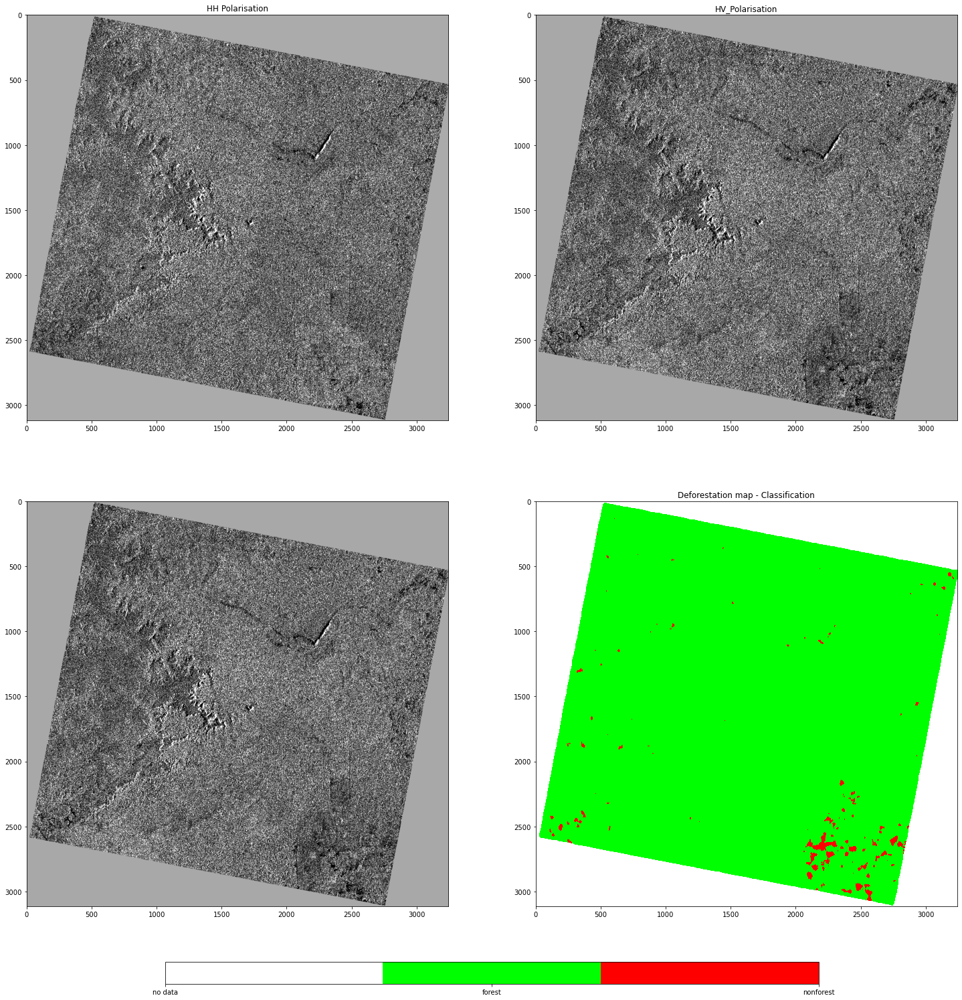

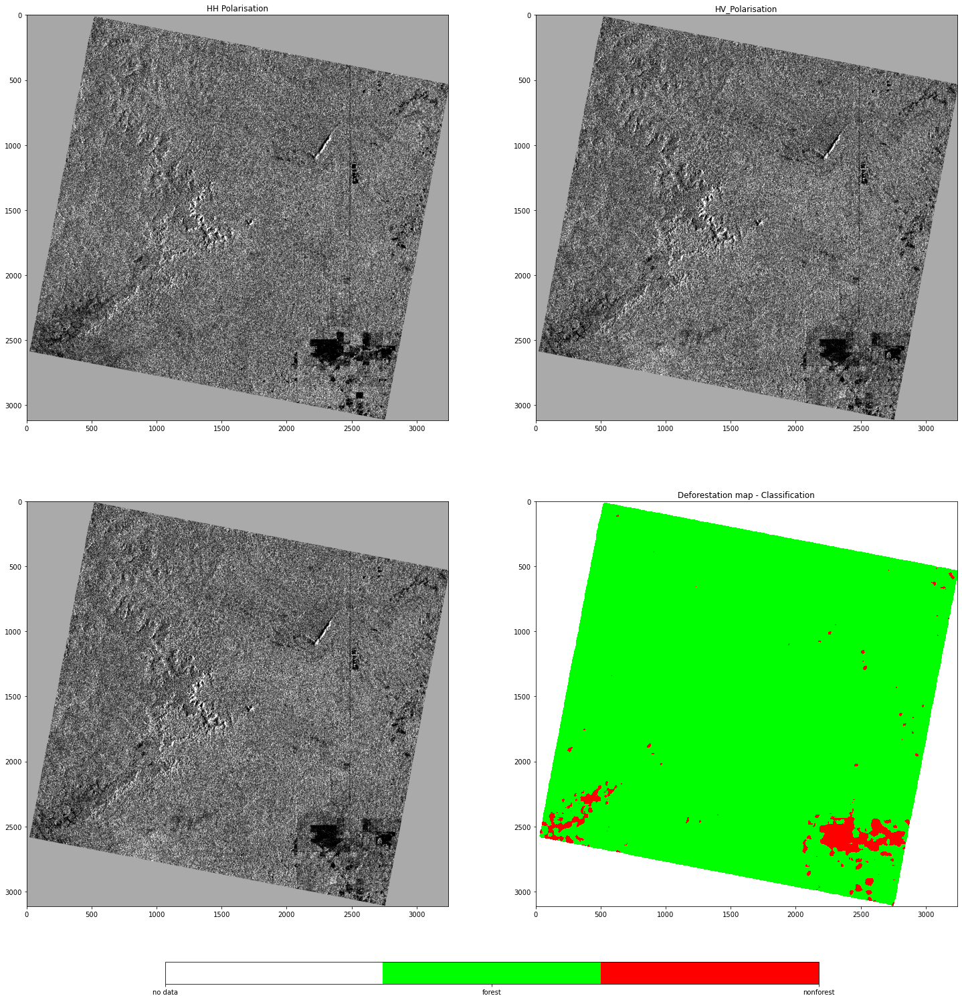

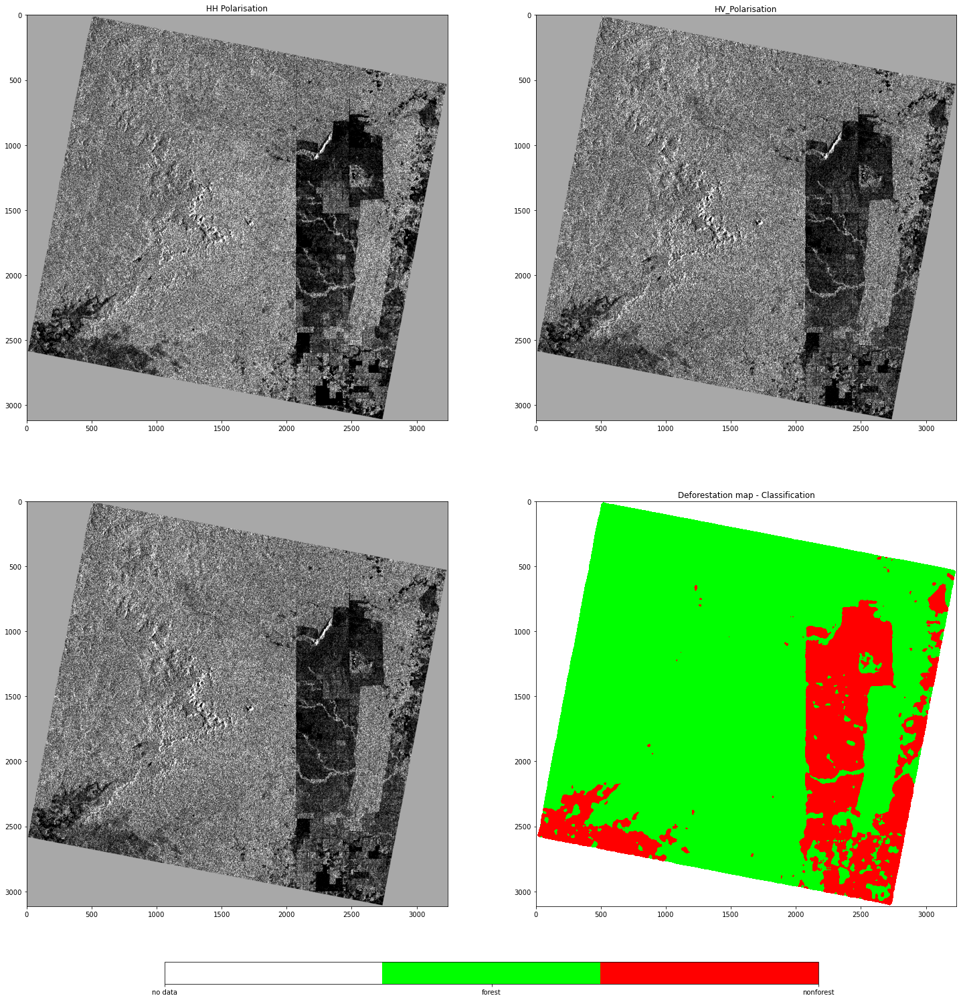

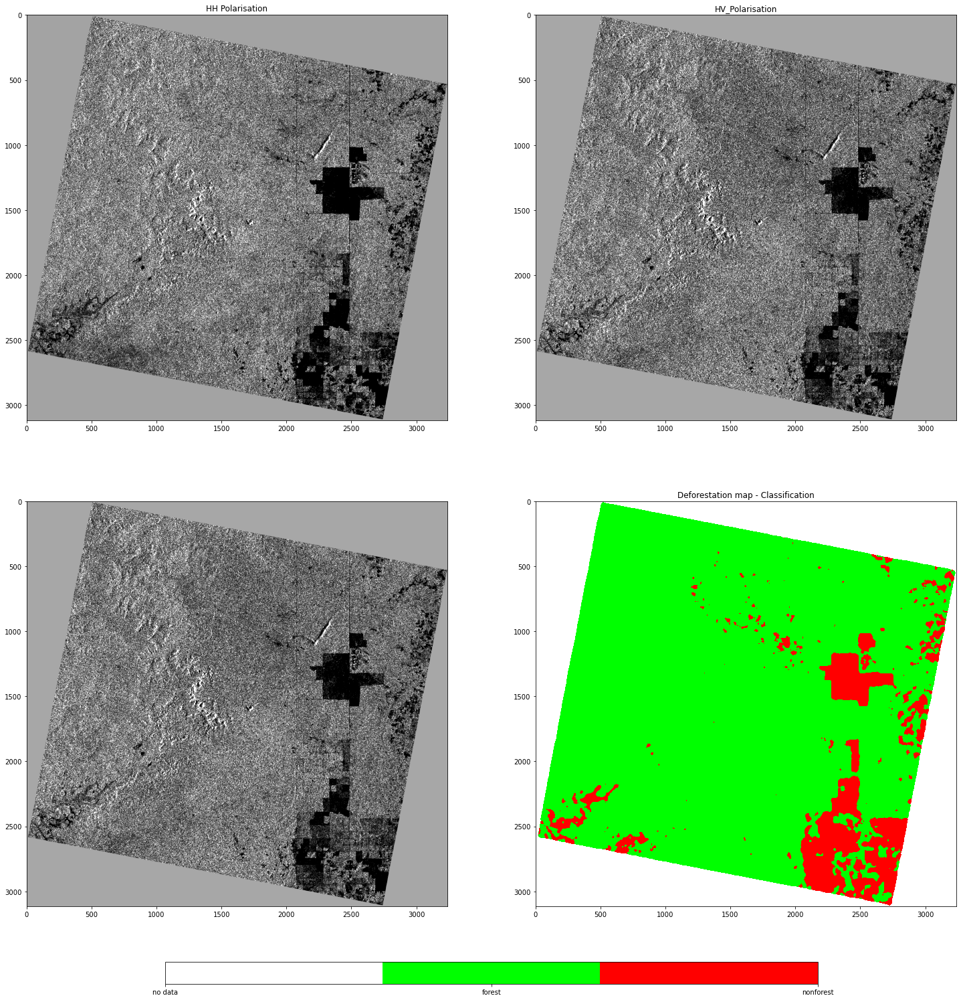

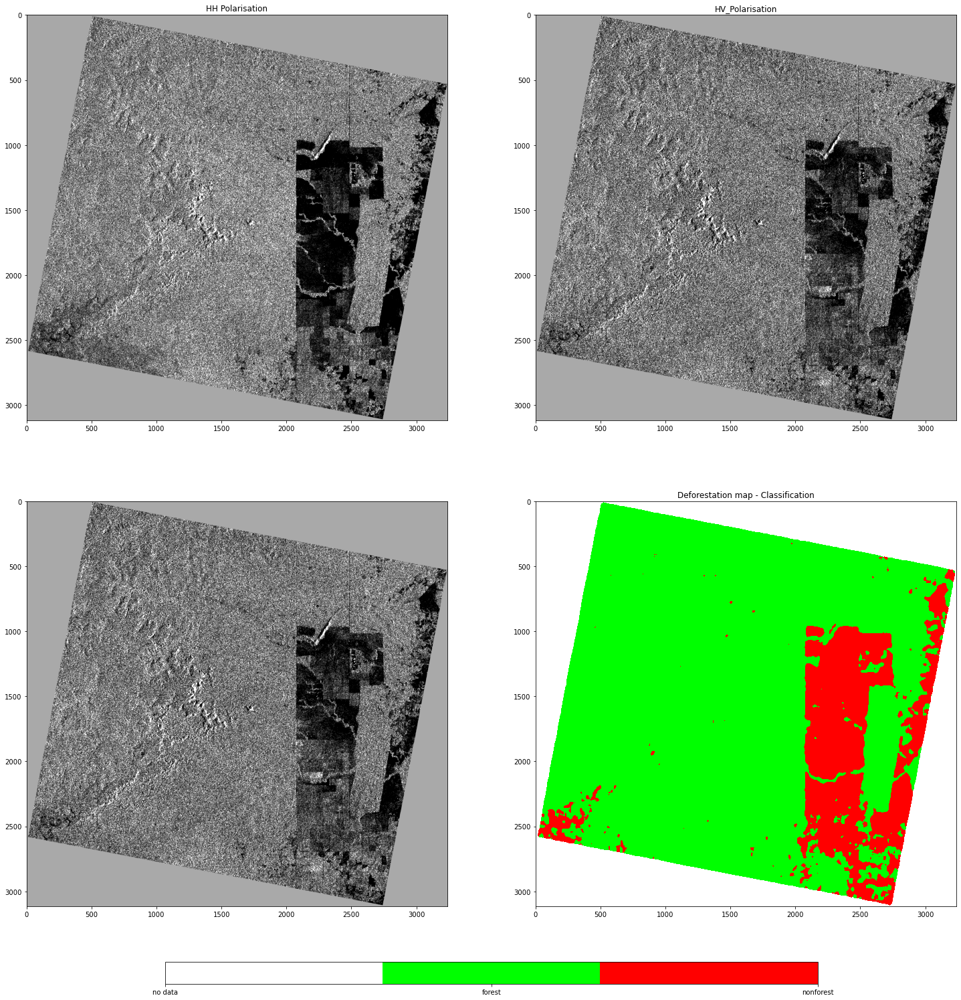

In [30]:
for i in range(len(test_img_list)):   
    test_img = gdal.Open(test_img_list[i])   # Open the last processed image
    # Load the HH and HV bands of the test image
    hh = test_img.GetRasterBand(1).ReadAsArray()
    hv = test_img.GetRasterBand(2).ReadAsArray()
    # Calculate the 5% and 95% percentile values to use to enhance the visualization through histogram stretch
    min_value_HH = np.nanpercentile(hh, 5)
    max_value_HH = np.nanpercentile(hh, 95)
    min_value_HV = np.nanpercentile(hv, 5)
    max_value_HV = np.nanpercentile(hv, 95)

    # Open the corresponding 1ce chart and get the Stage of Development attribute
    # Be carefull to the chart_p 
    chart_sa_test = rasterize_chart(test_img, chart_p, attribute='Class_ID') #'SA'

    ''' PAS BESOIN
    for label in sod_label:
        chart_sa_test = np.where(np.isin(chart_sa_test, sod_label.get(label)[0]), label, chart_sa_test)
    '''
    #chart_sa_test = np.where(mask, chart_sa_test, 5)
    chart_sa_test = np.where(chart_sa_test>0, chart_sa_test, 0)
    # Visualization
    fig, ((ax1,ax2), (ax3,ax4)) = plt.subplots(2,2, figsize=(25,35), gridspec_kw={"height_ratios":[1, 1]})
    im1 = ax1.imshow(hh, cmap='gray', vmin=min_value_HH, vmax=max_value_HH)
    ax1.set_title('HH Polarisation')
    im2 = ax2.imshow(hv, cmap='gray', vmin=min_value_HV, vmax=max_value_HV)
    ax2.set_title('HV_Polarisation')

    im3 = ax3.imshow(hv, cmap='gray', vmin=min_value_HV, vmax=max_value_HV)
    ax2.set_title('HV_Polarisation')

    '''
    im3 = ax3.imshow(hv+chart_sa_test, cmap='gray', vmin=min_value_HV, vmax=max_value_HV)
    ax3.imshow(chart_sa_test, cmap=cmap, vmin=0, vmax=2, interpolation='none',alpha=0.7)
    ax3.set_title('Stage of Development - Ice Chart')
    '''
    #im4 = ax4.imshow(result, cmap=cmap, vmin=-0.5, vmax=5.5, interpolation='none')
    im4 = ax4.imshow(class_prediction_list_filtered[i], cmap=cmap, vmin=0, vmax=2, interpolation='none')

    ax4.set_title('Deforestation map - Classification')
    cb = fig.colorbar(im4, ax=[ax1,ax2,ax3,ax4], orientation='horizontal', anchor=(0.5,1.8), aspect=30, shrink=0.7)
    cb.set_ticks(np.arange(0,3))
    #cb.set_ticklabels(['Ice Free', 'New Ice', 'Young Ice', 'First Year Ice', 'Old Ice', 'No Data'])
    cb.set_ticklabels(['no data','forest','nonforest'])

### 8.3: Extraction of the predicted results to a raster (for visualization in Qgis)

In [31]:
for i in range(len(test_img_list)):       
    " https://stackoverflow.com/questions/37648439/simplest-way-to-save-array-into-raster-file-in-python"
    test_img = gdal.Open(test_img_list[i])   # Open the last processed image
    img_id = re.split('Processing/test/without_speckle_filter/|_prep.tif',test_img_list[i].replace('\\','/'))[-2]
    dst_filename = './output/output_test_area_1/without_speckle_filter/post-processed/prediction_'+str(img_id)+'.tif'
    print(dst_filename)
    x_pixels = class_prediction_list_filtered[i].shape[0]  # number of pixels in x
    y_pixels = class_prediction_list_filtered[i].shape[1]  # number of pixels in y
    driver = gdal.GetDriverByName('GTiff')

    dataset = driver.Create(dst_filename,y_pixels, x_pixels, 1,gdal.GDT_Int16) #GDT_Float32
    dataset.GetRasterBand(1).WriteArray(class_prediction_list_filtered[i]) #np.transpose(result)

    # We use the preprocessed radar image to get same information to create the raster
    preprocessed_radar_img = gdal.Open(test_img_list[i]) 

    # follow code is adding GeoTranform and Projection
    geotrans=preprocessed_radar_img.GetGeoTransform()  #get GeoTranform from existed 'data0'

    proj=preprocessed_radar_img.GetProjection() #you can get from a exsited tif or import 
    print('GeoTransform: ' + str(geotrans))
    print('Projection' + str(proj))
    dataset.SetGeoTransform(geotrans)
    #outRaster.SetGeoTransform((originX, pixelWidth, 0, originY, 0, pixelHeight))
    dataset.SetProjection(proj)
    dataset.FlushCache()
    dataset=None
    print('\nSuccessful raster extraction !!')

./output/output_test_area_1/without_speckle_filter/post-processed/prediction_S1A_IW_GRDH_1SDV_20171002T224441_20171002T224506_018640_01F6EE_F159.tif
GeoTransform: (575077.5161324244, 10.0, 0.0, 1459850.677137078, 0.0, -10.0)
ProjectionPROJCS["WGS 84 / UTM zone 48N",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",105],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","32648"]]

Successful raster extraction !!
./output/output_test_area_1/without_speckle_filter/post-processed/prediction_S1A_IW_GRDH_1SDV_20181009T224448_20181009T224513_024065_